
**Import required libraries**

In [13]:
##Importing required libraries
import os
import time
import gc
import warnings
warnings.filterwarnings("ignore")
# data manipulation
import json
from pandas.io.json import json_normalize
import numpy as np
import pandas as pd
import pandas_profiling
# plot
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()

In [ ]:
#!pip install -U pandas-profiling

In [14]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [15]:
# Navigate to My Drive directory to store the dataset
%cd /content/drive/My Drive/Colab Notebooks/NLP_GStore/Project/

/content/drive/My Drive/Colab Notebooks/NLP_GStore/Project


In [ ]:
import urllib.request
print('Beginning file download with urllib2...')
url = 'https://storage.googleapis.com/gstoremlbucket/train_fjson.csv'
urllib.request.urlretrieve(url, 'train_json.csv')
url = 'https://storage.googleapis.com/gstoremlbucket/test_fjson.csv'  
urllib.request.urlretrieve(url, 'test_json.csv')

In [16]:
#Function to load the data from the folder
#Loads the data and flattens the JSON Columns such as
# Device, GeoNetwork, Totals, TrafficCource etc

%%time
def load_dataframe(csv_path='train.csv', nrows=None):
    JSON_COLUMNS = ['device', 'geoNetwork', 'totals', 'trafficSource']
    
    df = pd.read_csv(csv_path, 
                     converters={column: json.loads for column in JSON_COLUMNS}, 
                     dtype={'fullVisitorId': 'str'}, # Important!!
                     nrows=nrows)
    
    for column in JSON_COLUMNS:
        column_as_df = json_normalize(df[column])
        column_as_df.columns = [f"{column}.{subcolumn}" for subcolumn in column_as_df.columns]
        df = df.drop(column, axis=1).merge(column_as_df, right_index=True, left_index=True)
    print(f"Loaded {os.path.basename(csv_path)}. Shape: {df.shape}")
    return df

gc.collect()

CPU times: user 604 ms, sys: 1.95 ms, total: 606 ms
Wall time: 603 ms


In [17]:
# Dataframe contains 903.6K Rows and 55 Cols in Training
# Dataframe contains 804.7K Rows and 53 Cols in Training
traindf = load_dataframe('train.csv')
testdf = load_dataframe('test.csv')

Loaded train.csv. Shape: (903653, 55)
Loaded test.csv. Shape: (804684, 53)


**Basic Data Exploration**

In [18]:
# Taking a peek at the data. Below command displays first 5 rows
traindf.head()

,channelGrouping,date,fullVisitorId,sessionId,socialEngagementType,visitId,visitNumber,visitStartTime,device.browser,device.browserVersion,device.browserSize,device.operatingSystem,device.operatingSystemVersion,device.isMobile,device.mobileDeviceBranding,device.mobileDeviceModel,device.mobileInputSelector,device.mobileDeviceInfo,device.mobileDeviceMarketingName,device.flashVersion,device.language,device.screenColors,device.screenResolution,device.deviceCategory,geoNetwork.continent,geoNetwork.subContinent,geoNetwork.country,geoNetwork.region,geoNetwork.metro,geoNetwork.city,geoNetwork.cityId,geoNetwork.networkDomain,geoNetwork.latitude,geoNetwork.longitude,geoNetwork.networkLocation,totals.visits,totals.hits,totals.pageviews,totals.bounces,totals.newVisits,totals.transactionRevenue,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.adwordsClickInfo.criteriaParameters,trafficSource.isTrueDirect,trafficSource.referralPath,trafficSource.adwordsClickInfo.page,trafficSource.adwordsClickInfo.slot,trafficSource.adwordsClickInfo.gclId,trafficSource.adwordsClickInfo.adNetworkType,trafficSource.adwordsClickInfo.isVideoAd,trafficSource.adContent,trafficSource.campaignCode
0,Organic Search,20160902,1131660440785968503,1131660440785968503_1472830385,Not Socially Engaged,1472830385,1,1472830385,Chrome,not available in demo dataset,not available in demo dataset,Windows,not available in demo dataset,False,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,desktop,Asia,Western Asia,Turkey,Izmir,(not set),Izmir,not available in demo dataset,ttnet.com.tr,not available in demo dataset,not available in demo dataset,not available in demo dataset,1,1,1,1,1,NaN,(not set),google,organic,(not provided),not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Organic Search,20160902,377306020877927890,377306020877927890_1472880147,Not Socially Engaged,1472880147,1,1472880147,Firefox,not available in demo dataset,not available in demo dataset,Macintosh,not available in demo dataset,False,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,desktop,Oceania,Australasia,Australia,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,dodo.net.au,not available in demo dataset,not available in demo dataset,not available in demo dataset,1,1,1,1,1,NaN,(not set),google,organic,(not provided),not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Organic Search,20160902,3895546263509774583,3895546263509774583_1472865386,Not Socially Engaged,1472865386,1,1472865386,Chrome,not available in demo dataset,not available in demo dataset,Windows,not available in demo dataset,False,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,desktop,Europe,Southern Europe,Spain,Community of Madrid,(not set),Madrid,not available in demo dataset,unknown.unknown,not available in demo dataset,not available in demo dataset,not available in demo dataset,1,1,1,1,1,NaN,(not set),google,organic,(not provided),not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Organic Search,20160902,4763447161404445595,4763447161404445595_1472881213,Not Socially Engaged,1472881213,1,1472881213,UC Browser,not available in demo dataset,not available in demo dataset,Linux,not available in demo dataset,False,not ava

In [19]:
traindf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 903653 entries, 0 to 903652
Data columns (total 55 columns):
 #   Column                                             Non-Null Count   Dtype 
---  ------                                             --------------   ----- 
 0   channelGrouping                                    903653 non-null  object
 1   date                                               903653 non-null  int64 
 2   fullVisitorId                                      903653 non-null  object
 3   sessionId                                          903653 non-null  object
 4   socialEngagementType                               903653 non-null  object
 5   visitId                                            903653 non-null  int64 
 6   visitNumber                                        903653 non-null  int64 
 7   visitStartTime                                     903653 non-null  int64 
 8   device.browser                                     903653 non-null  object
 9   devi

In [ ]:
# The library below provides a quick summary of the datatraindf.profile_report()

In [ ]:
!pip install -U sweetviz

     |████████████████████████████████| 327kB 2.8MB/s 


In [ ]:
import sweetviz as sv

my_report = sv.analyze(traindf)
my_report.show_html() # Default arguments will generate to "SWEETVIZ_REPORT.html"
#Renamed this report to Initial_Analysis_Report.html
#The report contains the basic exploratory data analysis with plot distributions for individual independent variables

:FEATURES DONE:                    |█████████████████████| [100%]   01:05  -> (00:00 left)
:PAIRWISE DONE:                    |█████████████████████| [100%]   35:59  -> (00:00 left)


Creating Associations graph... DONE!
Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: no browser will pop up, the report is saved in your notebook/colab files.


### Target Variable Distribution ###

In [21]:
y = np.nan_to_num(np.array([float(i) for i in traindf['totals.transactionRevenue']]))
print('The ratio of customers with transaction revenue is', str((y != 0).mean()))   

The ratio of customers with transaction revenue is 0.0127427231470487


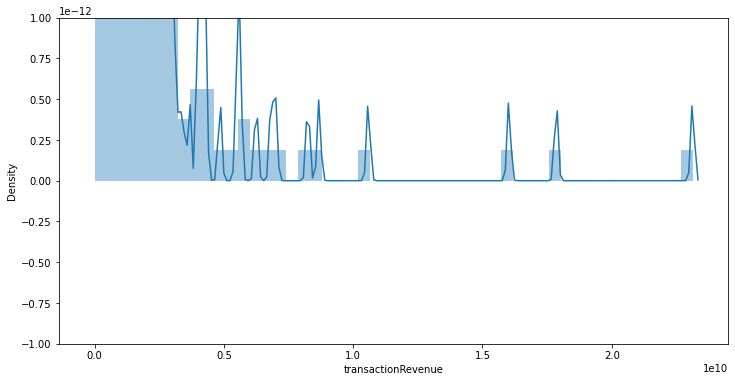

In [22]:
plt.figure(figsize=[12, 6])
sns.distplot(y[y!=0])
plt.xlabel('transactionRevenue')
plt.show()

In [25]:
traindf["totals.transactionRevenue"] = traindf["totals.transactionRevenue"].astype('float')
target = np.log1p(traindf.groupby("fullVisitorId")["totals.transactionRevenue"].sum())
print('The ratio of customers with transaction revenue is', str((target != 0).mean()))

The ratio of customers with transaction revenue is 0.013996726255903731


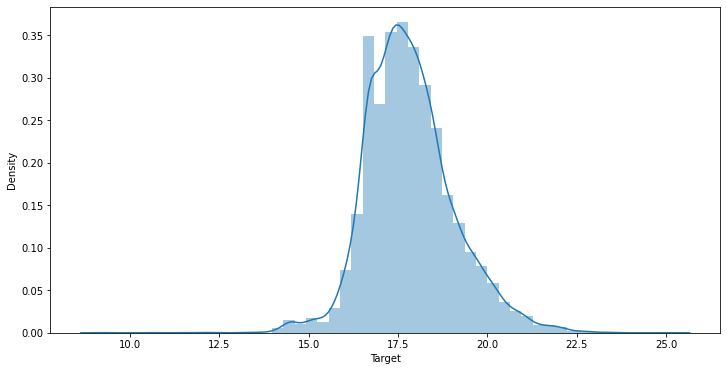

In [26]:
plt.figure(figsize=[12, 6])
sns.distplot(target[target!=0])
plt.xlabel('Target')
plt.show()

Device Group

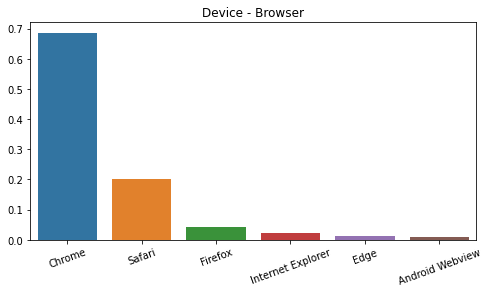

In [28]:
def plot_categorical(data, col, size=[8 ,4], xlabel_angle=0, title='', max_cat = None):
    '''use this for ploting the count of categorical features'''
    plotdata = data[col].value_counts() / len(data)
    if max_cat != None:
        plotdata = plotdata[max_cat[0]:max_cat[1]]
    plt.figure(figsize = size)
    sns.barplot(x = plotdata.index, y=plotdata.values)
    plt.title(title)
    if xlabel_angle!=0: 
        plt.xticks(rotation=xlabel_angle)
    plt.show()
plot_categorical(data=traindf, col='device.browser', size=[8 ,4], xlabel_angle=20, title='Device - Browser', max_cat=[0, 6])

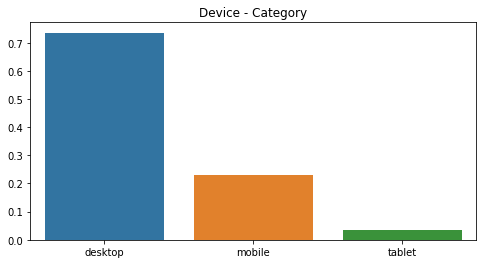

In [29]:
plot_categorical(data=traindf, col='device.deviceCategory', size=[8 ,4], xlabel_angle=0, title='Device - Category')

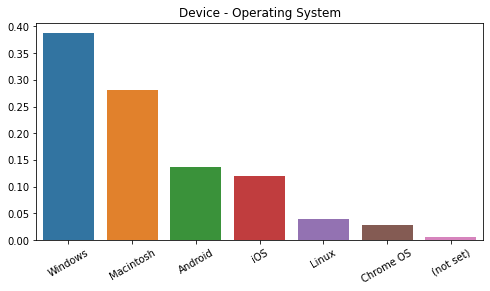

In [30]:
plot_categorical(data=traindf, col='device.operatingSystem', size=[8 ,4], xlabel_angle=30, 
                 title='Device - Operating System', max_cat = [0, 7])

Geo Network Group

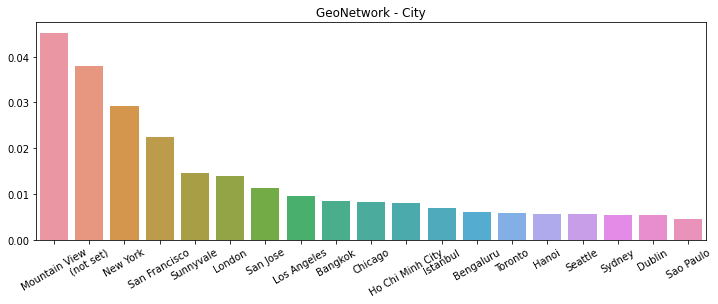

In [32]:
plot_categorical(data=traindf, col='geoNetwork.city', size=[12 ,4], xlabel_angle=30, 
                 title='GeoNetwork - City', max_cat = [1, 20])

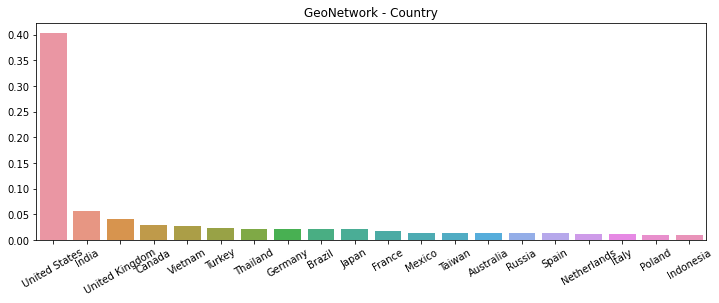

In [33]:
plot_categorical(data=traindf, col='geoNetwork.country', size=[12 ,4], xlabel_angle=30, 
                 title='GeoNetwork - Country', max_cat = [0, 20])

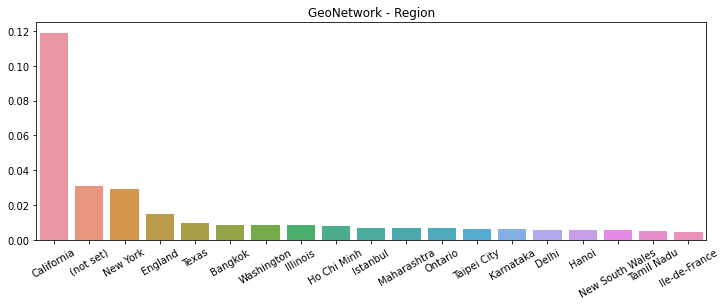

In [34]:
plot_categorical(data=traindf, col='geoNetwork.region', size=[12 ,4], xlabel_angle=30, 
                 title='GeoNetwork - Region', max_cat = [1, 20])

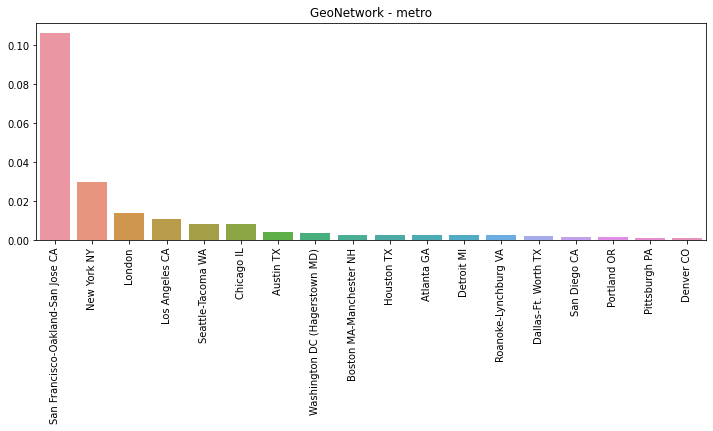

In [35]:
plot_categorical(data=traindf, col='geoNetwork.metro', size=[12 ,4], xlabel_angle=90, 
                 title='GeoNetwork - metro', max_cat = [2, 20])

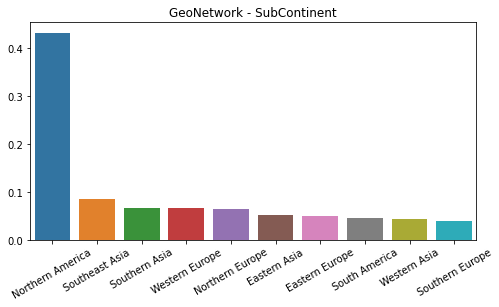

In [36]:
plot_categorical(data=traindf, col='geoNetwork.subContinent', size=[8 ,4], xlabel_angle=30, 
                 title='GeoNetwork - SubContinent', max_cat = [0, 10])

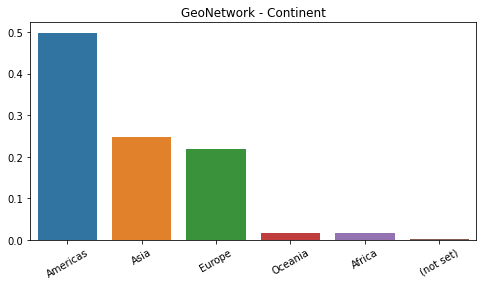

In [37]:
plot_categorical(data=traindf, col='geoNetwork.continent', size=[8 ,4], xlabel_angle=30, 
                 title='GeoNetwork - Continent')

##Totals##

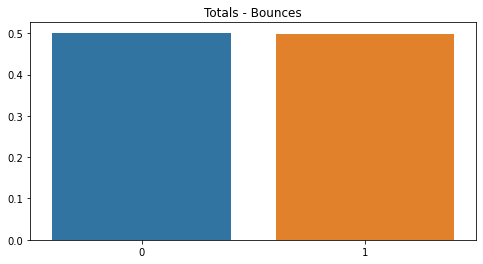

In [39]:
traindf['totals.bounces'] = traindf['totals.bounces'].fillna('0')
plot_categorical(data=traindf, col='totals.bounces', size=[8 ,4], xlabel_angle=0, title='Totals - Bounces')

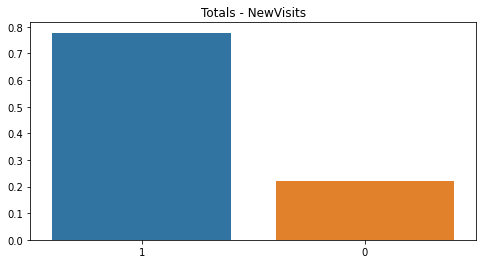

In [40]:
traindf['totals.newVisits'] = traindf['totals.newVisits'].fillna('0')
plot_categorical(data=traindf, col='totals.newVisits', size=[8 ,4], xlabel_angle=0, title='Totals - NewVisits')

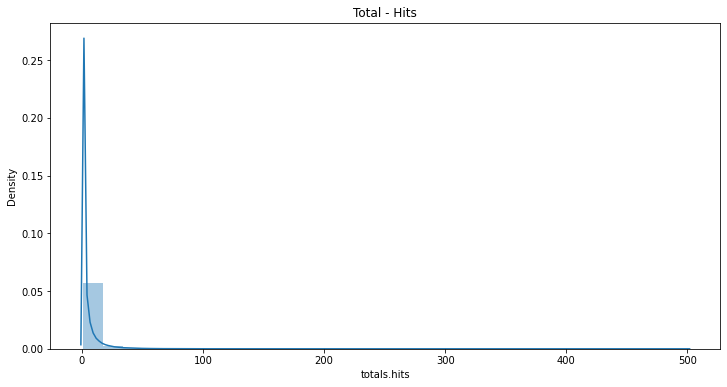

In [42]:
plt.figure(figsize=[12, 6])
sns.distplot(traindf['totals.hits'].astype('float'), kde=True,bins=30)
plt.xlabel('totals.hits')
plt.title('Total - Hits')
plt.show()

## Traffic Sources ##

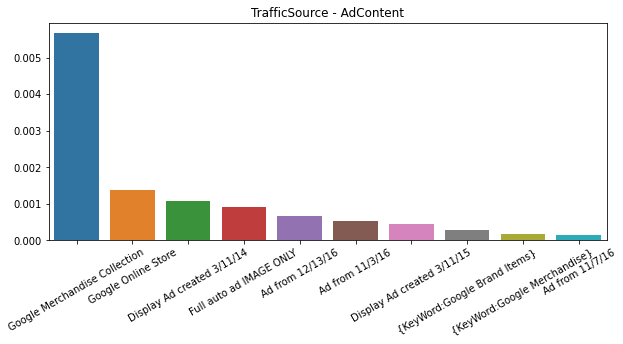

In [43]:
plot_categorical(data=traindf, col='trafficSource.adContent', size=[10 ,4], xlabel_angle=30, 
                 title='TrafficSource - AdContent', max_cat = [0, 10])

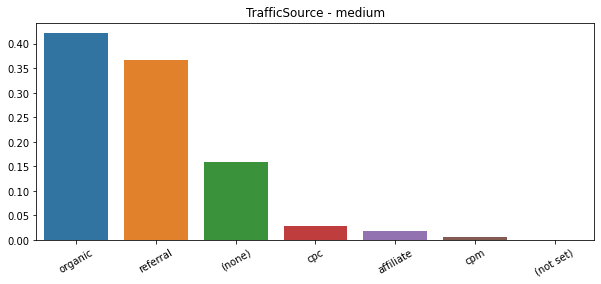

In [44]:
plot_categorical(data=traindf, col='trafficSource.medium', size=[10 ,4], xlabel_angle=30, 
                 title='TrafficSource - medium')

### Calculate transaction revenue for each category in each feature ###

/usr/local/lib/python3.6/dist-packages/plotly/tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead

